<img src = 'https://securecdn.pymnts.com/wp-content/uploads/2020/02/Score-Card-Company-Image-47.png'>

<h1 style="text-align:center;font-size:30px;" > Instacart Market Based analysis </h1>

<h1> 1. Business Problem </h1>

<h2> 1.1 Description </h2>

<p> Whether you shop from meticulously planned grocery lists or let whimsy guide your grazing, our unique food rituals define who we are. Instacart, a grocery ordering and delivery app, aims to make it easy to fill your refrigerator and pantry with your personal favorites and staples when you need them. After selecting products through the Instacart app, personal shoppers review your order and do the in-store shopping and delivery for you.

Instacart’s data science team plays a big part in providing this delightful shopping experience. Currently they use transactional data to develop models that predict which products a user will buy again, try for the first time, or add to their cart next during a session. <p>
<br>
> Credits: Kaggle

__ Problem Statement __
- which products will an instacart consumer will purchase again
-  we are predicting the user purchased the product will he purchase the item again, or try for the first time, or add to their cart next during a session.??

<h2> 1.2 Sources/Useful Links</h2>

- Source : https://www.kaggle.com/c/instacart-market-basket-analysis


<h2>1.3 Real world/Business Objectives and Constraints </h2>


1. You would want a probability of a each product to be reordered or not so that you can choose any threshold of choice.
2. No strict latency concerns.
3. Interpretability is partially important.

<h1>2. Machine Learning Probelm </h1>

<h2> 2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> 
- It has a seven file<br>
1 . Aisles.csv<br>
2 . Departments.csv : which consists of department_id and grocery department_name<br>
3 . Order_products_prior : It consists of user previous orders_id and did he reordered or not
And how many products he added to cart<br>
4 . Order_train_prior.csv : It is same as prior but it consists of the last order it will not have
history of orders<br>
5 . orders.csv : it consist of all users (prior,train,test also) and also it consist of<br>
        -> how many orders in a day of week<br>
        -> how many orders in hour of day<br>
        -> Order no of a user<br>
        -> days since prior: since how many days since his last order<br>
6 . products.csv : This consists of product id and product name<br>
7 . Submission.csv : This consists of test order that we have to predict the which products the
user will purchase again<br>
</p>

<h2> 2.2 Mapping the real world problem to an ML problem </h2>

<h3> 2.2.1 Type of Machine Leaning Problem </h3>

<p> It is a multi_label classification problem, for a given pair of questions we need to predict if they want to reorder or not. </p>

<h3> 2.2.2 Performance Metric </h3>

Source: https://www.kaggle.com/c/quora-question-pairs#evaluation

Metric(s): 
* Mean F1_score

<h1>3. Exploratory Data Analysis </h1>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
from wordcloud import wordcloud
import gc
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
from datetime import datetime
from wordcloud import WordCloud

In [2]:
aisles = pd.read_csv("aisles.csv")
departments = pd.read_csv("departments.csv")
order_prior = pd.read_csv("order_products__prior.csv")
order_train = pd.read_csv("order_products__train.csv")
orders      = pd.read_csv("orders.csv")
product     = pd.read_csv("products.csv")

In [3]:
orders[orders.eval_set=='train'].nunique()

order_id                  131209
user_id                   131209
eval_set                       1
order_number                  97
order_dow                      7
order_hour_of_day             24
days_since_prior_order        31
dtype: int64

In [4]:
orders[orders.eval_set=='test'].nunique()

order_id                  75000
user_id                   75000
eval_set                      1
order_number                 97
order_dow                     7
order_hour_of_day            24
days_since_prior_order       31
dtype: int64

In [5]:
orders[orders.eval_set=='prior'].nunique()

order_id                  3214874
user_id                    206209
eval_set                        1
order_number                   99
order_dow                       7
order_hour_of_day              24
days_since_prior_order         31
dtype: int64

<hr> The orders.csv file tells that which order belong to train,test and prior with the eval_set column. Here prior is the previous history of the user purchsed the products

=>Now we can see that in orders file there are 

            ->3214874 orders in prior 
            ->75000 orders in test
            ->131209 orders in train

In [3]:
## Merging order_prior data with product_id and aisle_id and department tables for analysis
prior_analysis = order_prior.merge(product,on='product_id').merge(aisles,on='aisle_id')\
                                .merge(departments,on='department_id')
prior_analysis.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,2,33120,1,1,Organic Egg Whites,86,16,eggs,dairy eggs
1,26,33120,5,0,Organic Egg Whites,86,16,eggs,dairy eggs
2,120,33120,13,0,Organic Egg Whites,86,16,eggs,dairy eggs
3,327,33120,5,1,Organic Egg Whites,86,16,eggs,dairy eggs
4,390,33120,28,1,Organic Egg Whites,86,16,eggs,dairy eggs


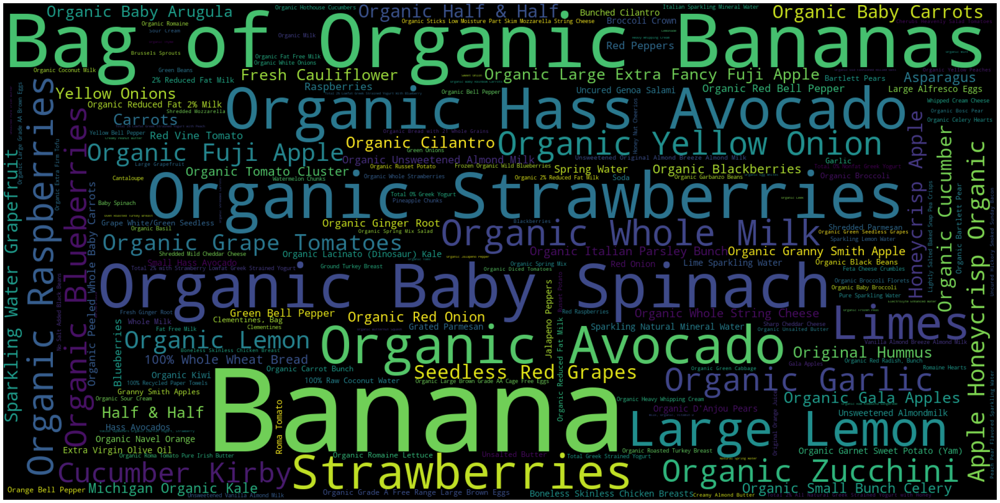

Time taken to run this cell : 0:00:12.333515


In [35]:
# Ploting word cloud
result=prior_analysis.product_name.value_counts().to_dict()
start = datetime.now()

# Lets first convert the 'result' dictionary to 'list of tuples'
tup = dict(result.items())
#Initializing WordCloud using frequencies of tags.
wordcloud = WordCloud(    background_color='black',
                          width=1600,
                          height=800,
                    ).generate_from_frequencies(tup)
fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
print("Time taken to run this cell :", datetime.now() - start)

In [31]:
## Merging order_prior data with product_id and aisle_id and department tables for analysis
train_analysis = order_train.merge(product,on='product_id').merge(aisles,on='aisle_id')\
                                .merge(departments,on='department_id')
train_analysis.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,1,49302,1,1,Bulgarian Yogurt,120,16,yogurt,dairy eggs
1,816049,49302,7,1,Bulgarian Yogurt,120,16,yogurt,dairy eggs
2,1242203,49302,1,1,Bulgarian Yogurt,120,16,yogurt,dairy eggs
3,1383349,49302,11,1,Bulgarian Yogurt,120,16,yogurt,dairy eggs
4,1787378,49302,8,0,Bulgarian Yogurt,120,16,yogurt,dairy eggs


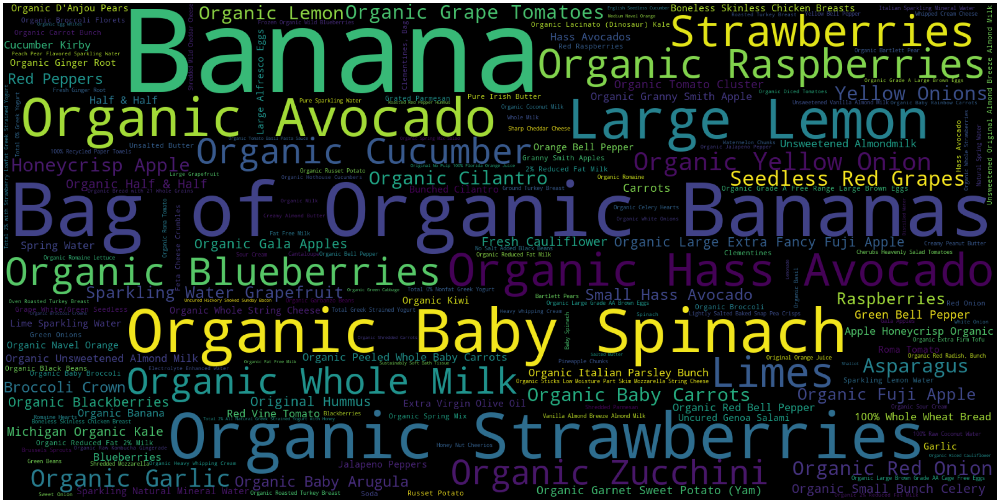

Time taken to run this cell : 0:00:06.056451


In [37]:
# Ploting word cloud
result=train_analysis.product_name.value_counts().to_dict()
start = datetime.now()

# Lets first convert the 'result' dictionary to 'list of tuples'
tup = dict(result.items())
#Initializing WordCloud using frequencies of tags.
wordcloud = WordCloud(    background_color='black',
                          width=1600,
                          height=800,
                    ).generate_from_frequencies(tup)
fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
print("Time taken to run this cell :", datetime.now() - start)

 As we can see most of the user and orders both in train and prior  by a lot of Banana and organic_items like organic Strawberries,organic_baby_spinach..etc as shown in plot using word_count
 
 => So we can see that lot of people orders consists of organic_items and banana's

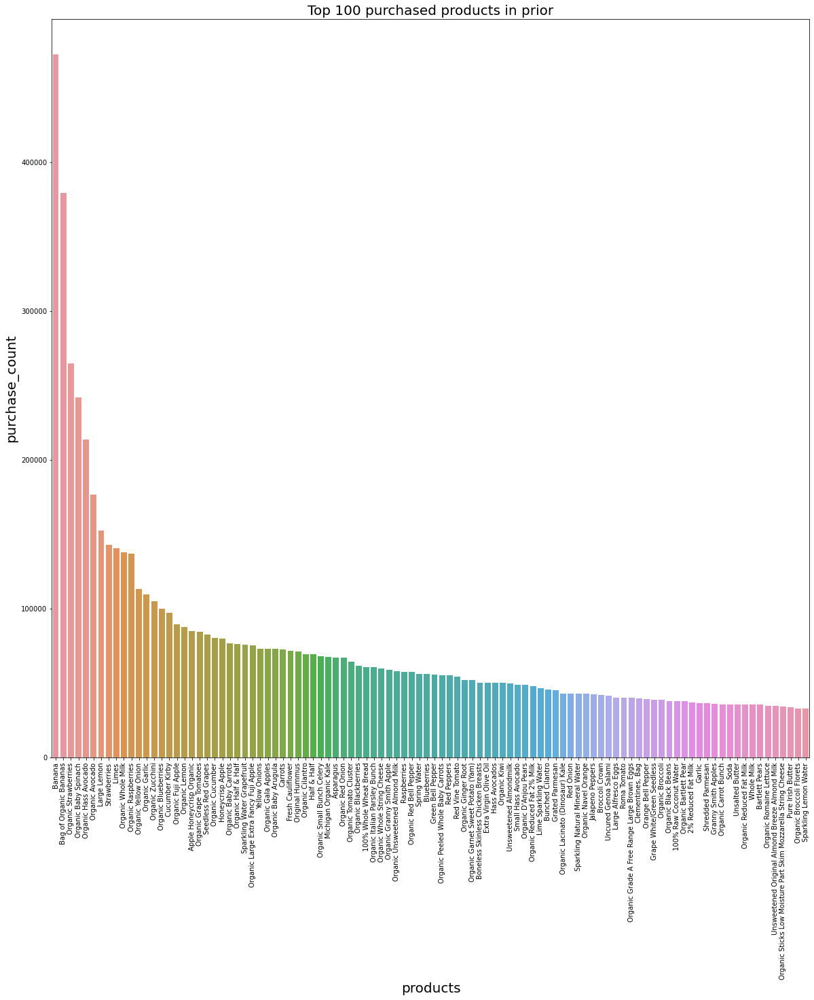

In [38]:
result = prior_analysis.product_name.value_counts()
i=np.arange(100)
plt.figure(figsize=(20,20))
sn.barplot(result.head(100).index,result.head(100).values)
plt.title('Top 100 purchased products in prior',fontsize=20)
plt.xticks(i, result.reset_index().iloc[:,0],rotation='vertical')
plt.xlabel('products',fontsize=20)
plt.ylabel('purchase_count',fontsize=20)
plt.show()

As we can see the above plot the Top-100 products purchased by users of instacart in Prior data 

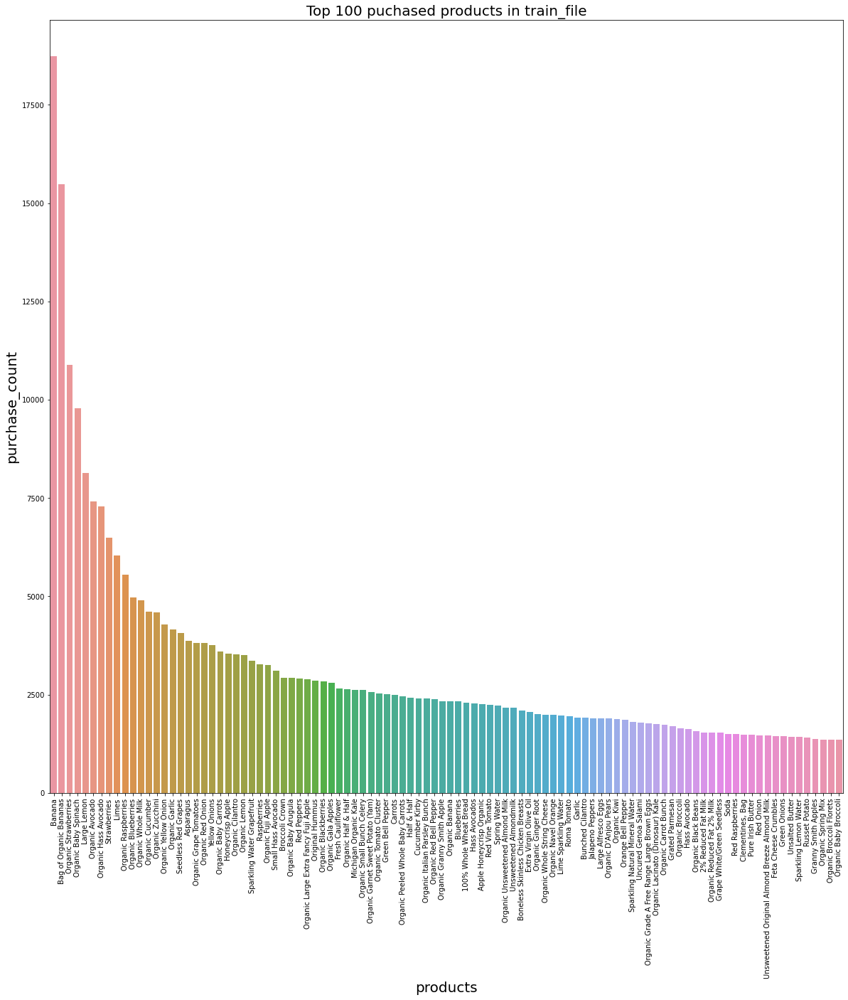

In [11]:
result = train_analysis.product_name.value_counts()
i=np.arange(100)
plt.figure(figsize=(20,20))
sn.barplot(result.head(100).index,result.head(100).values)
plt.title('Top 100 puchased products in train_file',fontsize=20)
plt.xticks(i, result.reset_index().iloc[:,0],rotation='vertical')
plt.xlabel('products',fontsize=20)
plt.ylabel('purchase_count',fontsize=20)
plt.show()

As we can see from above two bar plots the frequency of top 100 products in train and prior the frequency of products are very similar

And also we the word_count plot for prior and train are also very similar in that also we can see that banana's and organic food item's are mostly purchased

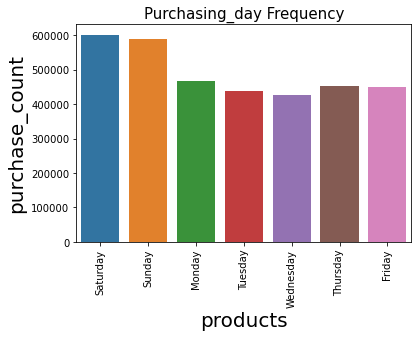

In [12]:
purchase_day = orders.order_dow.value_counts().sort_index()
sn.barplot(purchase_day.index,purchase_day.values)
plt.title('Purchasing_day Frequency',fontsize=15)
plt.xticks(ticks=purchase_day.index,rotation='vertical',labels=['Saturday','Sunday','Monday','Tuesday','Wednesday','Thursday','Friday'])
plt.xlabel('products',fontsize=20)
plt.ylabel('purchase_count',fontsize=20)
plt.show()

From the above plot we can see that week_days like saturday and sunday also friday purchase frequency are high

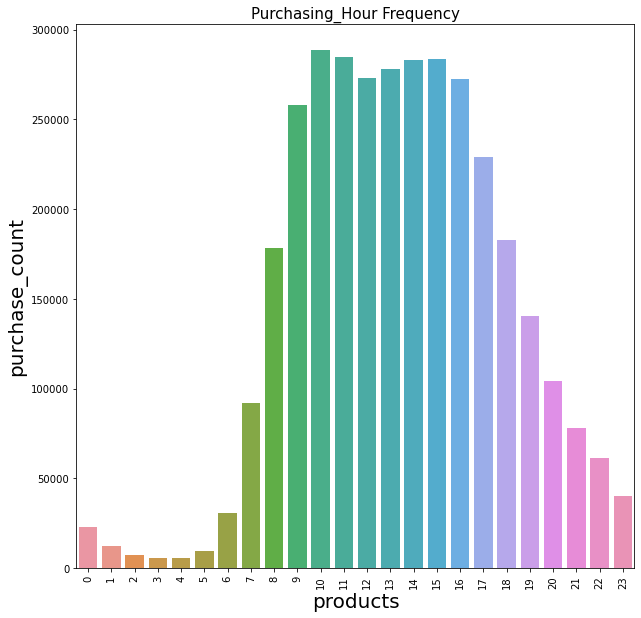

In [13]:
Count_hour = orders.order_hour_of_day.value_counts().sort_index()
plt.figure(figsize=(10,10))
sn.barplot(Count_hour.index,Count_hour.values)
plt.title('Purchasing_Hour Frequency',fontsize=15)
plt.xticks(ticks=Count_hour.index,rotation='vertical')
plt.xlabel('products',fontsize=20)
plt.ylabel('purchase_count',fontsize=20)
plt.show()

From above plot we can see that the peak hours are 8 to 16 and 18 to 23 are medium and 0 to 5 are very low frequency of orders getting from users

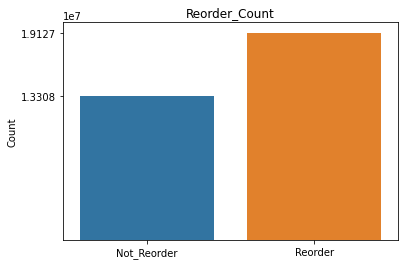

In [14]:
prior_reord = order_prior.reordered.value_counts()
sn.barplot(prior_reord.index,prior_reord.values)
plt.title("Reorder_Count")
plt.ylabel("Count")
plt.xticks(ticks=prior_reord.index,labels=['Reorder','Not_Reorder'])
plt.yticks(ticks=prior_reord.values)
plt.show()

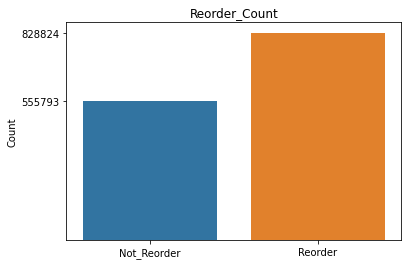

In [15]:
train_reord = order_train.reordered.value_counts()
sn.barplot(train_reord.index,train_reord.values)
plt.title("Reorder_Count")
plt.ylabel("Count")
plt.xticks(ticks=train_reord.index,labels=['Reorder','Not_Reorder'])
plt.yticks(ticks=train_reord.values)
plt.show()

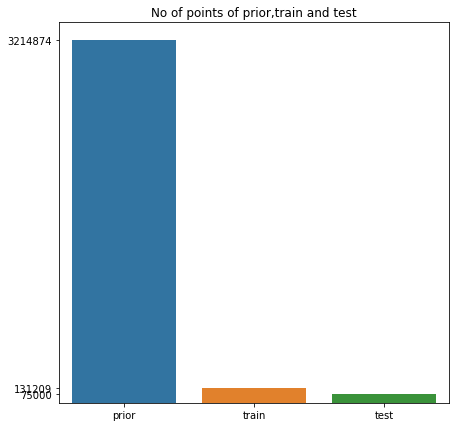

In [16]:
eval_set_count = orders.eval_set.value_counts()
plt.figure(figsize=(7,7))
sn.barplot(eval_set_count.index,eval_set_count.values)
plt.title("No of points of prior,train and test")
plt.yticks(ticks=eval_set_count.values,labels=[str(i) for i in eval_set_count.values])
plt.show()

Now we can the distribution of the data there are 3214874 prior data points and 131209  train data points and 75000 data points in test

In [5]:
all_items = product.merge(departments,on='department_id').merge(aisles,on='aisle_id')

all_items.product_name = all_items.product_name.str.lower().replace(' ','_')

all_items.aisle = all_items.aisle.str.lower().replace(" ","_")

In [6]:
all_items.head()

,product_id,product_name,aisle_id,department_id,department,aisle
0,1,chocolate sandwich cookies,61,19,snacks,cookies cakes
1,78,nutter butter cookie bites go-pak,61,19,snacks,cookies cakes
2,102,danish butter cookies,61,19,snacks,cookies cakes
3,172,gluten free all natural chocolate chip cookies,61,19,snacks,cookies cakes
4,285,mini nilla wafers munch pack,61,19,snacks,cookies cakes


In [7]:
order_prior = order_prior.merge(all_items,on='product_id')

In [45]:
Aisle_count = prior_analysis[['aisle','reordered']].groupby("aisle").aggregate(np.sum)

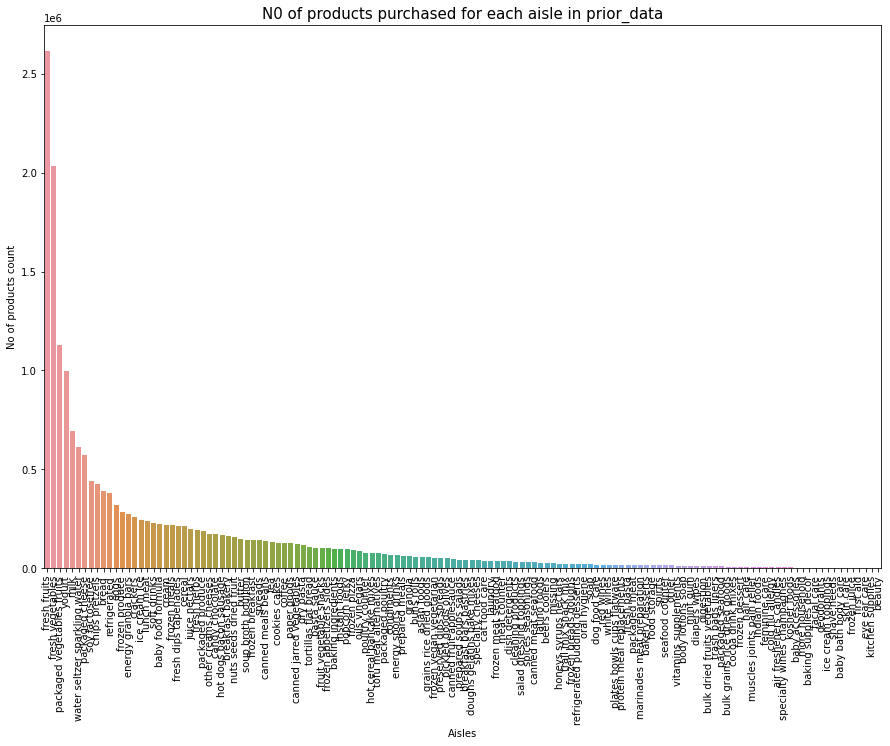

In [46]:
plt.figure(figsize=(15,10))
sn.barplot(Aisle_count.sort_values(by='reordered',ascending=False).index,
           Aisle_count.sort_values(by='reordered',ascending=False).reordered)
plt.xticks(rotation='vertical')
plt.title("N0 of products purchased for each aisle in prior_data",fontsize=15)
plt.ylabel("No of products count",fontsize=10)
plt.yticks()
plt.xlabel('Aisles',fontsize=10)
plt.show()

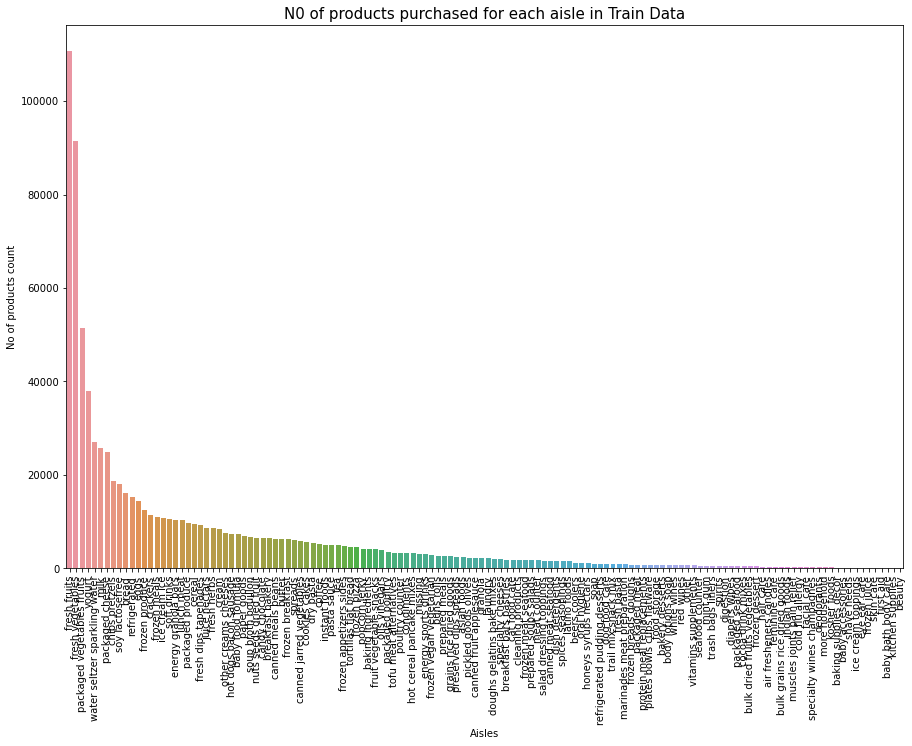

In [9]:
Aisle_count_train = train_analysis[['aisle','reordered']].groupby("aisle").aggregate(np.sum)
plt.figure(figsize=(15,10))
sn.barplot(Aisle_count_train.sort_values(by='reordered',ascending=False).index,
           Aisle_count_train.sort_values(by='reordered',ascending=False).reordered)
plt.xticks(rotation='vertical')
plt.title("N0 of products purchased for each aisle in Train Data",fontsize=15)
plt.ylabel("No of products count",fontsize=10)
plt.yticks()
plt.xlabel('Aisles',fontsize=10)
plt.show()

In [48]:
Department_count = prior_analysis[['department','reordered']].groupby("department").aggregate(np.sum)

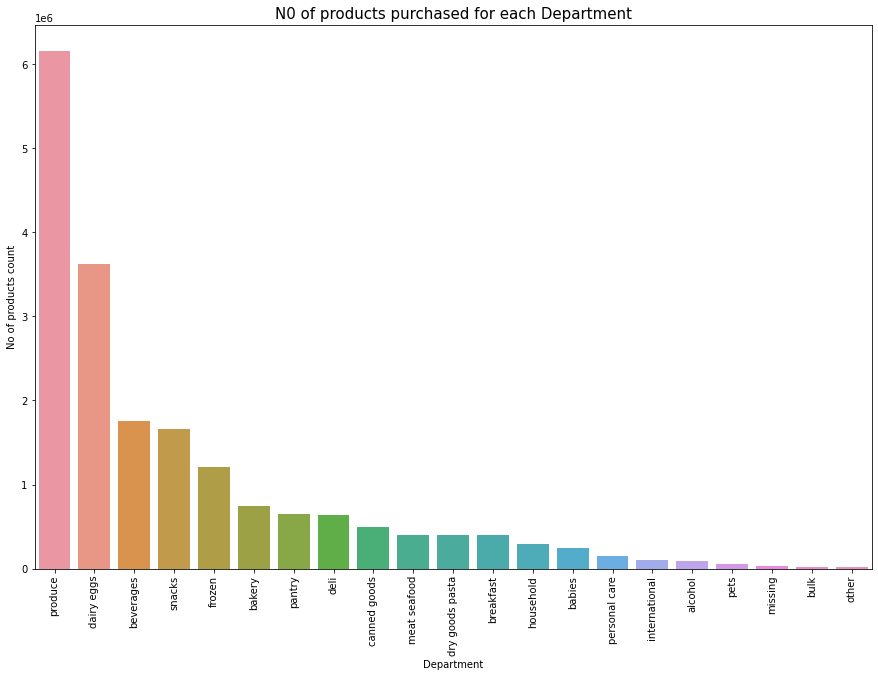

In [49]:
plt.figure(figsize=(15,10))
sn.barplot(Department_count.sort_values(by='reordered',ascending=False).index,
           Department_count.sort_values(by='reordered',ascending=False).reordered)
plt.xticks(rotation='vertical')
plt.title("N0 of products purchased for each Department",fontsize=15)
plt.ylabel("No of products count",fontsize=10)
plt.xlabel('Department',fontsize=10)
plt.show()

### prior order analysis with reorder or target vairable

In [11]:
prior_analysis = order_prior.merge(orders,on='order_id')

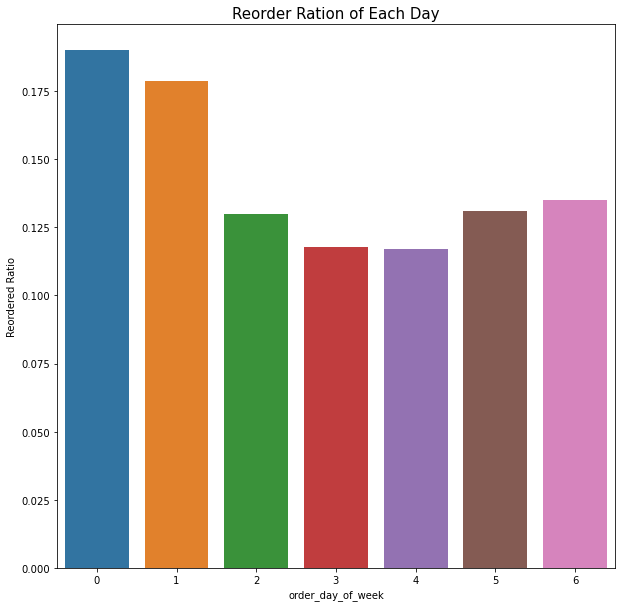

In [12]:
total_no_reorders = prior_analysis.reordered.sum()
plt.figure(figsize=(10,10))

sn.barplot(prior_analysis.groupby(['order_dow']).agg('sum').index,
           prior_analysis.groupby(['order_dow']).agg('sum').iloc[:,3]/total_no_reorders)
plt.title("Reorder Ration of Each Day",fontsize = 15)
plt.xlabel("order_day_of_week",fontsize=10)
plt.ylabel("Reordered Ratio",fontsize=10)
plt.show()

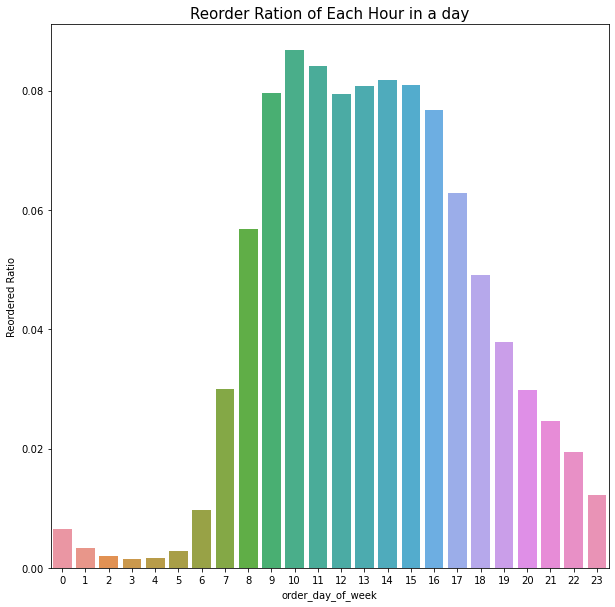

In [13]:
#total_no_reorders = prior_analysis.reordered.sum()
plt.figure(figsize=(10,10))
sn.barplot(prior_analysis.groupby(['order_hour_of_day']).agg('sum').index,
           prior_analysis.groupby(['order_hour_of_day']).agg('sum').iloc[:,3]/total_no_reorders)
plt.title("Reorder Ration of Each Hour in a day",fontsize = 15)
plt.xlabel("order_day_of_week",fontsize=10)
plt.ylabel("Reordered Ratio",fontsize=10)
plt.show()

In [16]:
frist_item = prior_analysis[prior_analysis.add_to_cart_order==1]

In [17]:
gc.collect()

41472

In [18]:
frist_item=frist_item[['product_name','add_to_cart_order']].groupby('product_name').agg('sum').sort_values(ascending=False,by='add_to_cart_order')

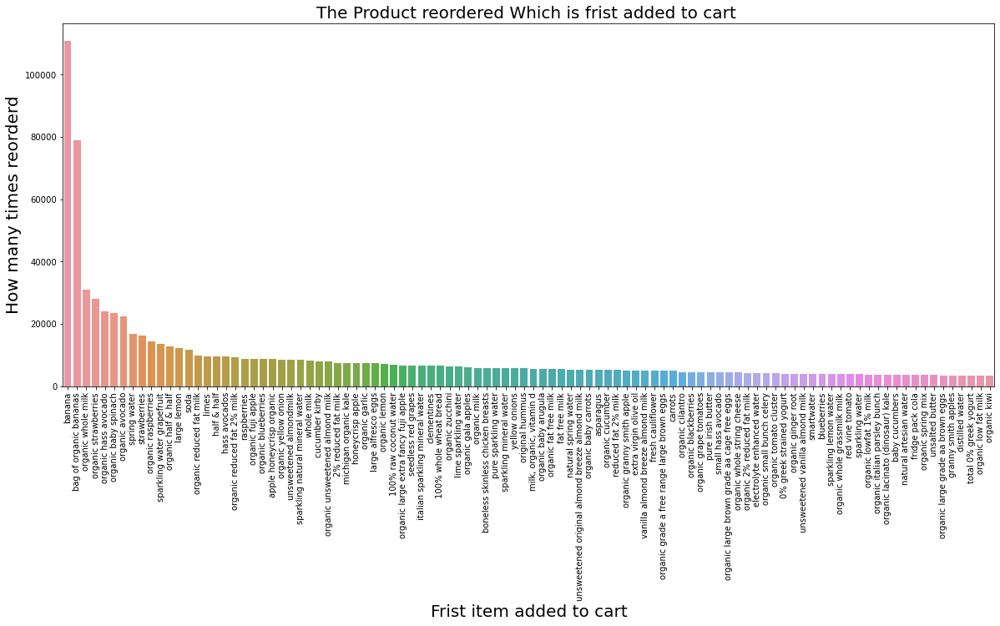

In [19]:
plt.figure(figsize=(20,8))
sn.barplot(frist_item.index[:100],frist_item.add_to_cart_order[:100])
plt.xticks(rotation='vertical')
plt.xlabel("Frist item added to cart",fontsize=20)
plt.ylabel("How many times reorderd",fontsize=20)
plt.title("The Product reordered Which is frist added to cart ",fontsize=20)
plt.show()

In [20]:
from tqdm import tqdm

In [21]:
product__ = []
aisly   = []
count   = []
for e in tqdm(aisles.aisle):
    product__.append(prior_analysis[prior_analysis.aisle==e]['product_name'].value_counts().index[0])
    count.append(prior_analysis[prior_analysis.aisle==e]['product_name'].value_counts().values[0])
    aisly.append(e)

100%|████████████████████████████████████████████████████████████████████████████████| 134/134 [10:09<00:00,  4.55s/it]


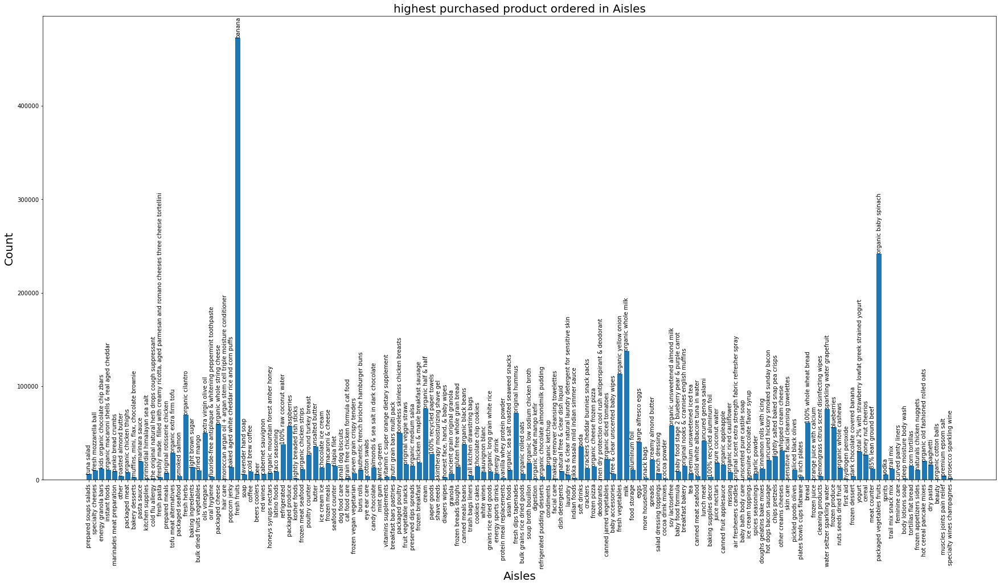

In [22]:

plt.figure(figsize=(30,15))
bar=plt.bar(aisly,count)
plt.title("highest purchased product ordered in Aisles",fontsize=20)
plt.xlabel("Aisles",fontsize=20)
plt.ylabel("Count",fontsize=20)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product__[i], ha='center', va='bottom',rotation=90)
    i=i+1

In [23]:
product__ = []
aisle__ = []
count = []
i=0
temp = prior_analysis[prior_analysis.reordered==1]
for i in tqdm(aisles.aisle):
    product__.append(temp[temp.aisle==i]['product_name'].value_counts().index[0])
    count.append(temp[temp.aisle==i]['product_name'].value_counts().values[0])
    aisle__.append(i)

100%|████████████████████████████████████████████████████████████████████████████████| 134/134 [07:07<00:00,  3.19s/it]


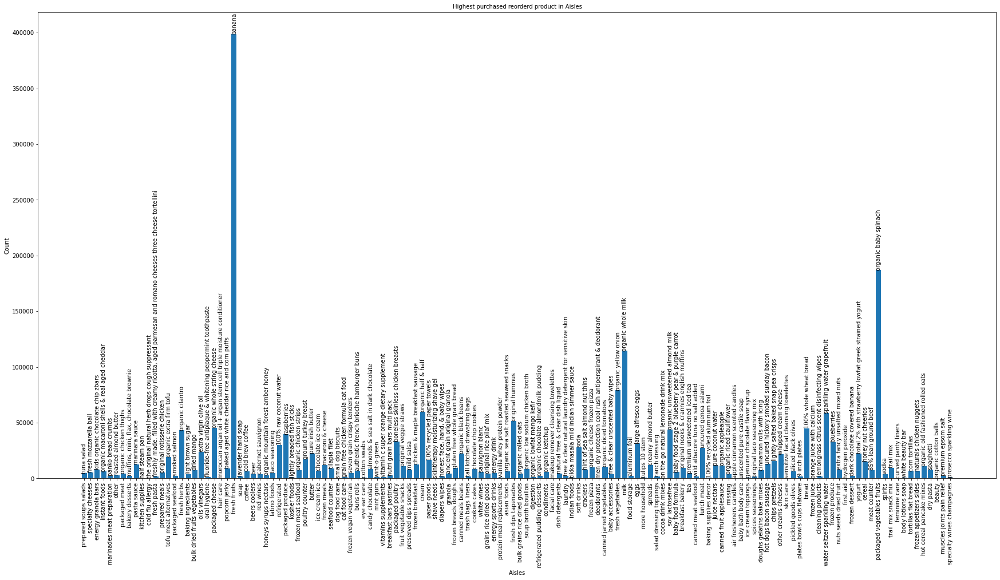

In [24]:

plt.figure(figsize=(30,15))
bar=plt.bar(aisle__,count)
plt.title("Highest purchased reorderd product in Aisles",fontsize=10)
plt.xlabel("Aisles",fontsize=10)
plt.ylabel("Count",fontsize=10)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product__[i], ha='center', va='bottom',rotation=90)
    i=i+1

## Train anlaysis with Reorder

In [34]:
train_analysis = train_analysis.merge(orders,on='order_id')
train_analysis.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1,49302,1,1,Bulgarian Yogurt,120,16,yogurt,dairy eggs,112108,train,4,4,10,9.0
1,1,11109,2,1,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,other creams cheeses,dairy eggs,112108,train,4,4,10,9.0
2,1,22035,8,1,Organic Whole String Cheese,21,16,packaged cheese,dairy eggs,112108,train,4,4,10,9.0
3,1,10246,3,0,Organic Celery Hearts,83,4,fresh vegetables,produce,112108,train,4,4,10,9.0
4,1,49683,4,0,Cucumber Kirby,83,4,fresh vegetables,produce,112108,train,4,4,10,9.0


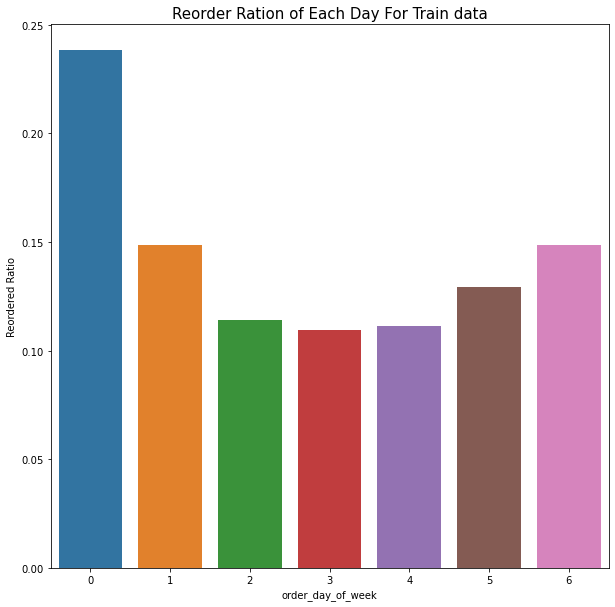

In [35]:
total_no_reorders = train_analysis.reordered.sum()
plt.figure(figsize=(10,10))

sn.barplot(train_analysis.groupby(['order_dow']).agg('sum').index,
           train_analysis.groupby(['order_dow']).agg('sum').iloc[:,3]/total_no_reorders)
plt.title("Reorder Ration of Each Day For Train data",fontsize = 15)
plt.xlabel("order_day_of_week",fontsize=10)
plt.ylabel("Reordered Ratio",fontsize=10)
plt.show()

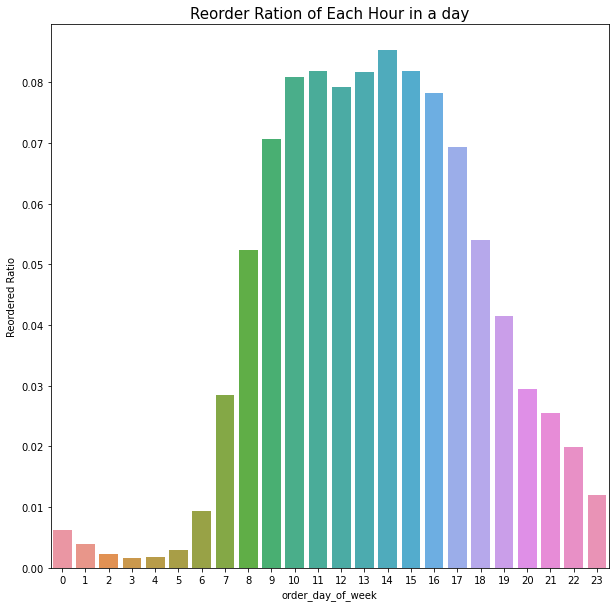

In [36]:
#total_no_reorders = train_analysis.reordered.sum()
plt.figure(figsize=(10,10))
sn.barplot(train_analysis.groupby(['order_hour_of_day']).agg('sum').index,
           train_analysis.groupby(['order_hour_of_day']).agg('sum').iloc[:,3]/total_no_reorders)
plt.title("Reorder Ration of Each Hour in a day",fontsize = 15)
plt.xlabel("order_day_of_week",fontsize=10)
plt.ylabel("Reordered Ratio",fontsize=10)
plt.show()

In [40]:
frist_item = train_analysis[train_analysis.add_to_cart_order==1]

In [41]:
frist_item=frist_item[['product_name','add_to_cart_order']].groupby('product_name').agg('sum').sort_values(ascending=False,by='add_to_cart_order')

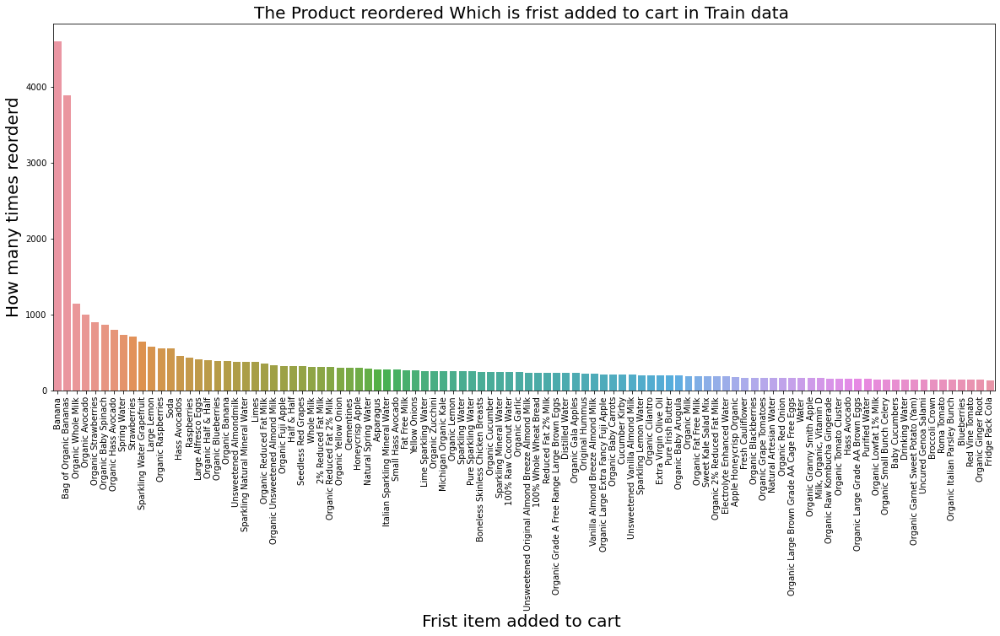

In [42]:
plt.figure(figsize=(20,8))
sn.barplot(frist_item.index[:100],frist_item.add_to_cart_order[:100])
plt.xticks(rotation='vertical')
plt.xlabel("Frist item added to cart ",fontsize=20)
plt.ylabel("How many times reorderd",fontsize=20)
plt.title("The Product reordered Which is frist added to cart in Train data ",fontsize=20)
plt.show()

=>From train and prior analysis plots of reorder ratio of each day we can see that day 0 and day 1 has highest ratio, So therefore the chance of getting the products is high in these days

=>From prior and train plots The reorder Ratio in order_per_hour is high in 9 to16 hrs and there may probalility of geting orders is very high

### As we can see that from above the product first added to cart and also reordered is banana 
     => so the banana has high probability of reordering 

In [44]:
product__ = []
aisly   = []
count   = []
for e in tqdm(aisles.aisle):
    product__.append(train_analysis[train_analysis.aisle==e]['product_name'].value_counts().index[0])
    count.append(train_analysis[train_analysis.aisle==e]['product_name'].value_counts().values[0])
    aisly.append(e)

100%|████████████████████████████████████████████████████████████████████████████████| 134/134 [00:21<00:00,  6.28it/s]


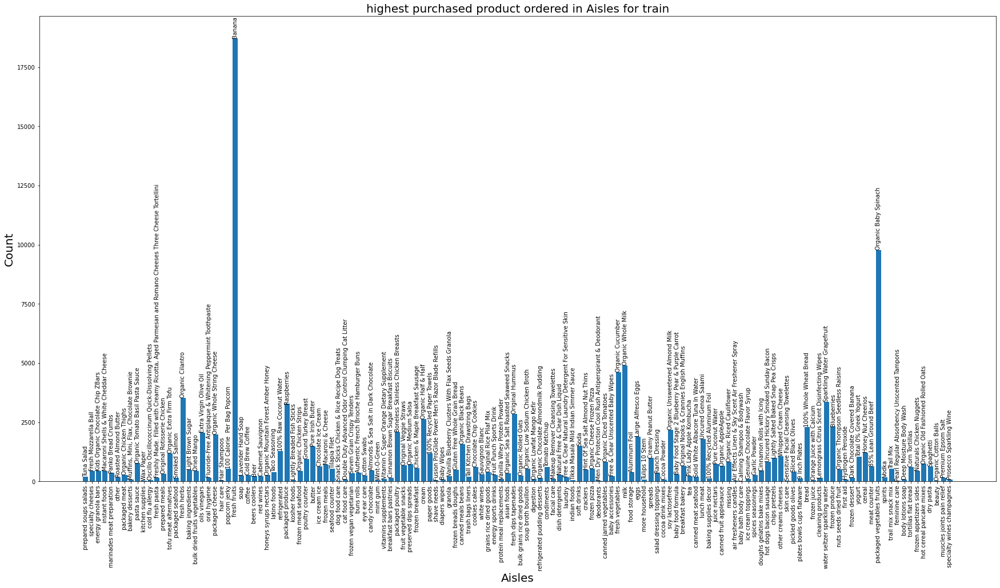

In [45]:

plt.figure(figsize=(30,15))
bar=plt.bar(aisly,count)
plt.title("highest purchased product ordered in Aisles for train",fontsize=20)
plt.xlabel("Aisles",fontsize=20)
plt.ylabel("Count",fontsize=20)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product__[i], ha='center', va='bottom',rotation=90)
    i=i+1

In [46]:
product__ = []
aisle__ = []
count = []
i=0
temp = train_analysis[train_analysis.reordered==1]
for i in tqdm(aisles.aisle):
    product__.append(temp[temp.aisle==i]['product_name'].value_counts().index[0])
    count.append(temp[temp.aisle==i]['product_name'].value_counts().values[0])
    aisle__.append(i)

100%|████████████████████████████████████████████████████████████████████████████████| 134/134 [00:12<00:00, 10.53it/s]


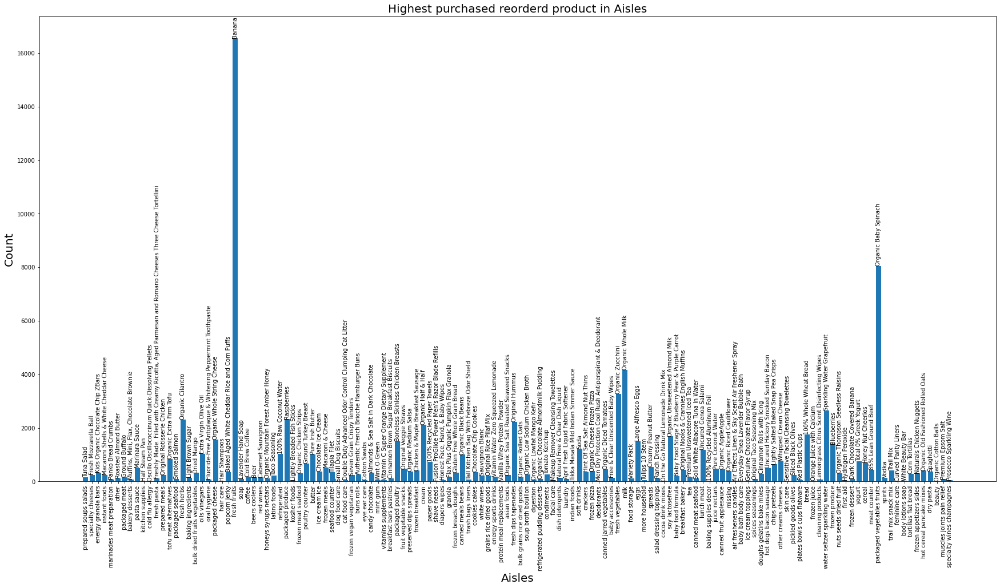

In [47]:

plt.figure(figsize=(30,15))
bar=plt.bar(aisle__,count)
plt.title("Highest purchased reorderd product in Aisles",fontsize=20)
plt.xlabel("Aisles",fontsize=20)
plt.ylabel("Count",fontsize=20)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product__[i], ha='center', va='bottom',rotation=90)
    i=i+1

In [100]:
product = []
count =[]
hours = []
for i in tqdm(prior_analysis.order_hour_of_day.unique()):
    product.append(prior_analysis[prior_analysis.order_hour_of_day==i]['product_name'].value_counts().index[0])
    count.append(prior_analysis[prior_analysis.order_hour_of_day==i]['product_name'].value_counts().values[0])
    hours.append(i)

100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:22<00:00,  1.06it/s]


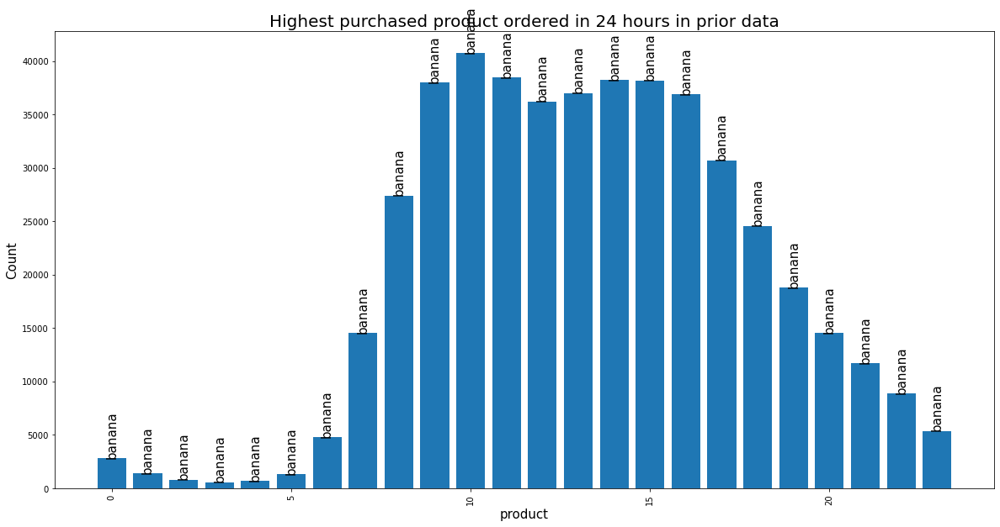

In [101]:

plt.figure(figsize=(20,10))
bar=plt.bar(hours,count)
plt.title("Highest purchased product ordered in 24 hours in prior data",fontsize=20)
plt.xlabel("product",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product[i], ha='center', va='bottom',rotation=90,fontsize=15)
    i=i+1

In [95]:
product = []
count = []
day = []

for i in tqdm(prior_analysis.order_dow.unique()):
    product.append(prior_analysis[prior_analysis.order_dow==i]['product_name'].value_counts().index[0])
    count.append(prior_analysis[prior_analysis.order_dow==i]['product_name'].value_counts().values[0])
    day.append(i)

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.07s/it]


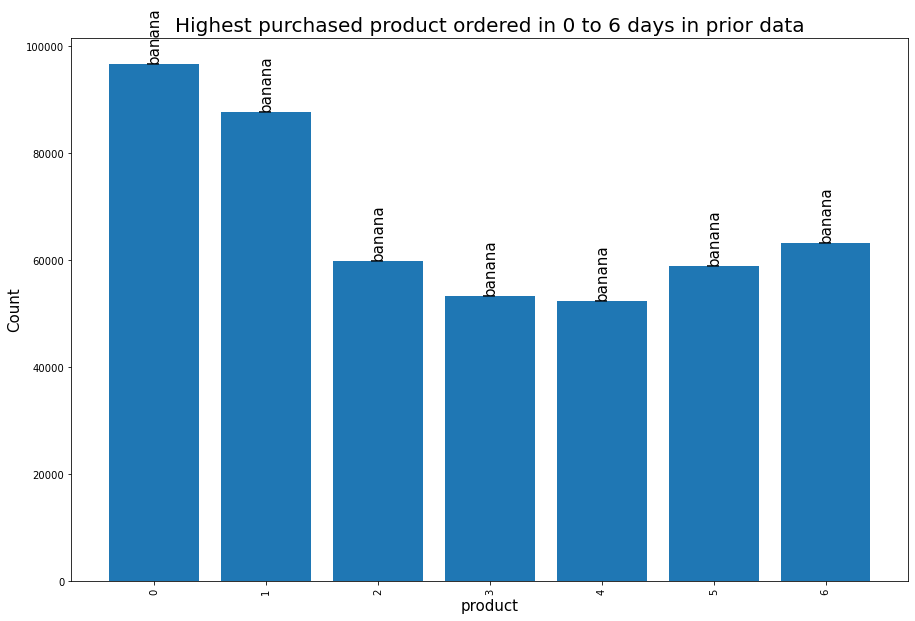

In [96]:

plt.figure(figsize=(15,10))
bar=plt.bar(day,count)
plt.title("Highest purchased product ordered in 0 to 6 days in prior data",fontsize=20)
plt.xlabel("product",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product[i], ha='center', va='bottom',rotation=90,fontsize=15)
    i=i+1

In [97]:
product = []
count =[]
hours = []
for i in tqdm(train_analysis.order_hour_of_day.unique()):
    product.append(train_analysis[train_analysis.order_hour_of_day==i]['product_name'].value_counts().index[0])
    count.append(train_analysis[train_analysis.order_hour_of_day==i]['product_name'].value_counts().values[0])
    hours.append(i)

100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:01<00:00, 20.43it/s]


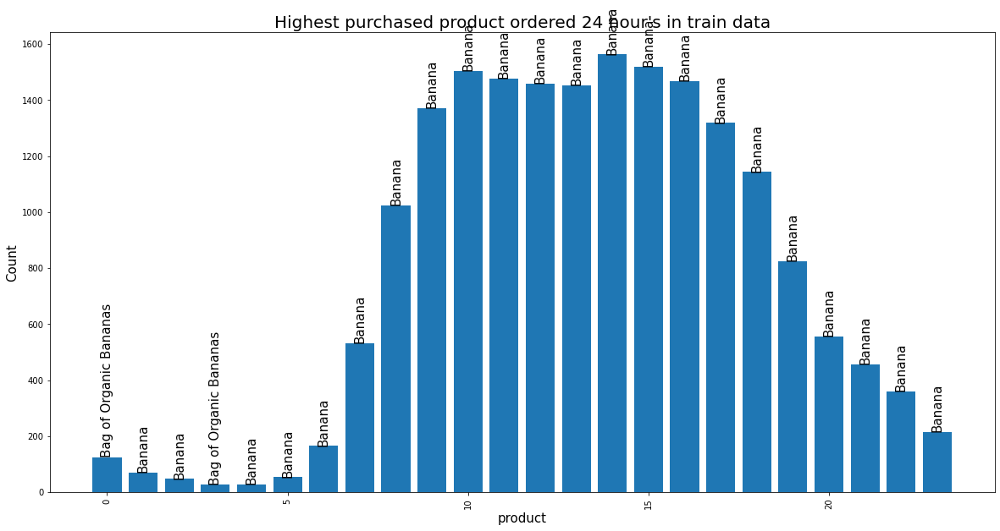

In [99]:

plt.figure(figsize=(20,10))
bar=plt.bar(hours,count)
plt.title("Highest purchased product ordered 24 hour's in train data",fontsize=20)
plt.xlabel("product",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product[i], ha='center', va='bottom',rotation=90,fontsize=15)
    i=i+1

In [102]:
product = []
count = []
day = []

for i in tqdm(train_analysis.order_dow.unique()):
    product.append(train_analysis[train_analysis.order_dow==i]['product_name'].value_counts().index[0])
    count.append(train_analysis[train_analysis.order_dow==i]['product_name'].value_counts().values[0])
    day.append(i)

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:01<00:00,  6.90it/s]


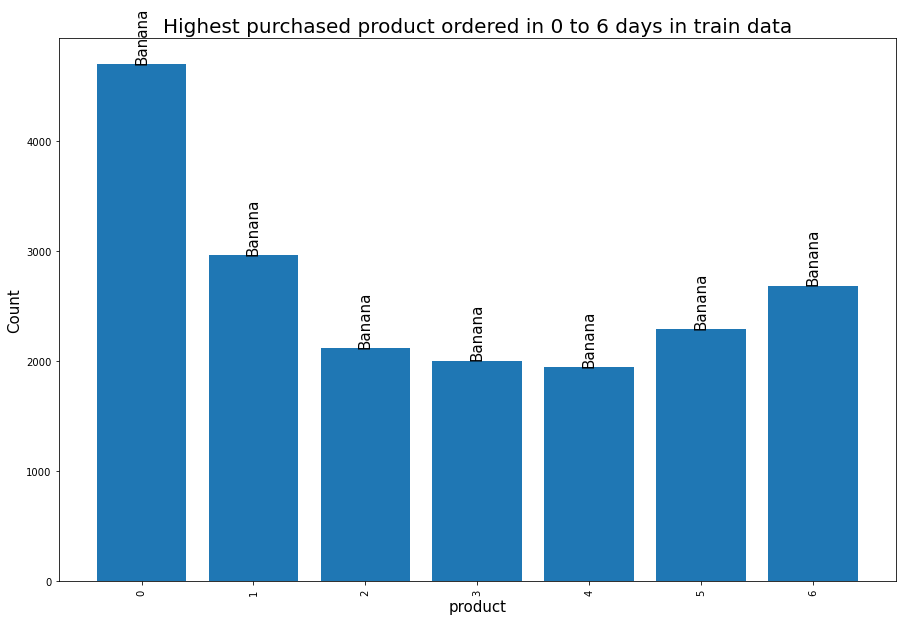

In [103]:

plt.figure(figsize=(15,10))
bar=plt.bar(day,count)
plt.title("Highest purchased product ordered in 0 to 6 days in train data",fontsize=20)
plt.xlabel("product",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(rotation='vertical')
i=0
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height,product[i], ha='center', va='bottom',rotation=90,fontsize=15)
    i=i+1

### Weekly analysis

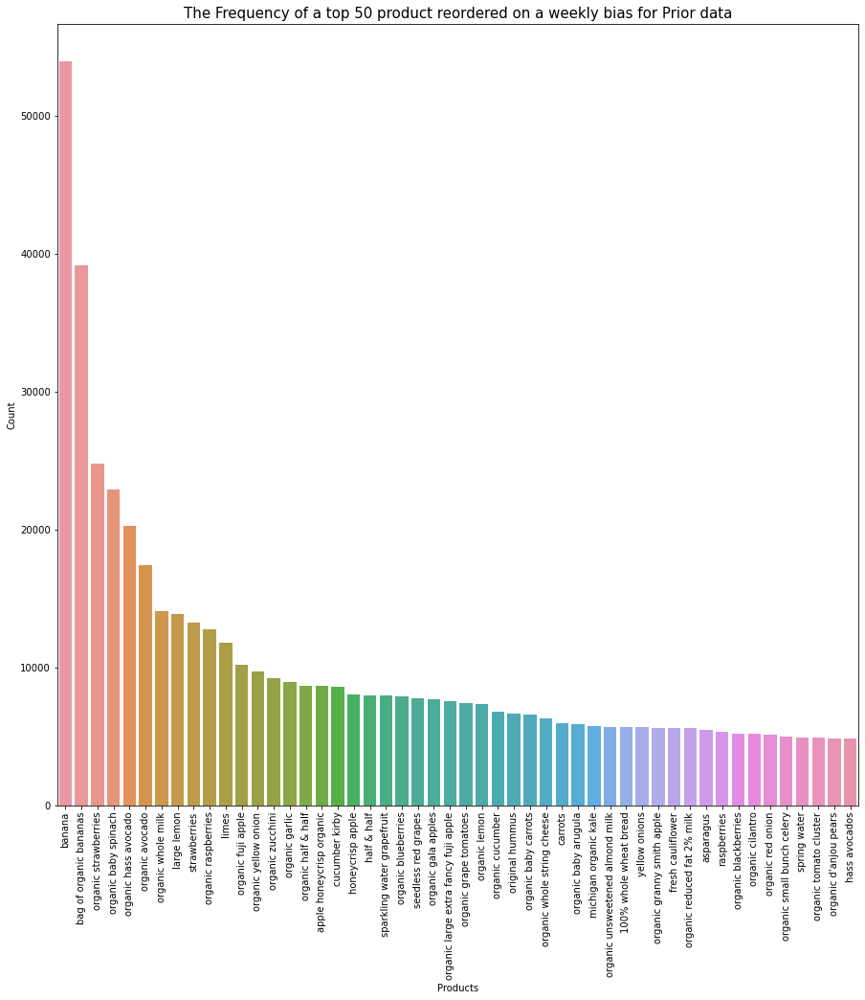

In [131]:
temp = prior_analysis[prior_analysis.reordered==1]
plt.figure(figsize=(15,15))

sn.barplot(temp[temp.days_since_prior_order==7]['product_name'].value_counts().index[:50],
          temp[temp.days_since_prior_order==7]['product_name'].value_counts().values[:50])
plt.xticks(rotation='vertical')
plt.title("The Frequency of a top 50 product reordered on a weekly bias for Prior data",fontsize=15)
plt.ylabel('Count',fontsize=10)
plt.xlabel("Products",fontsize=10)
plt.show()

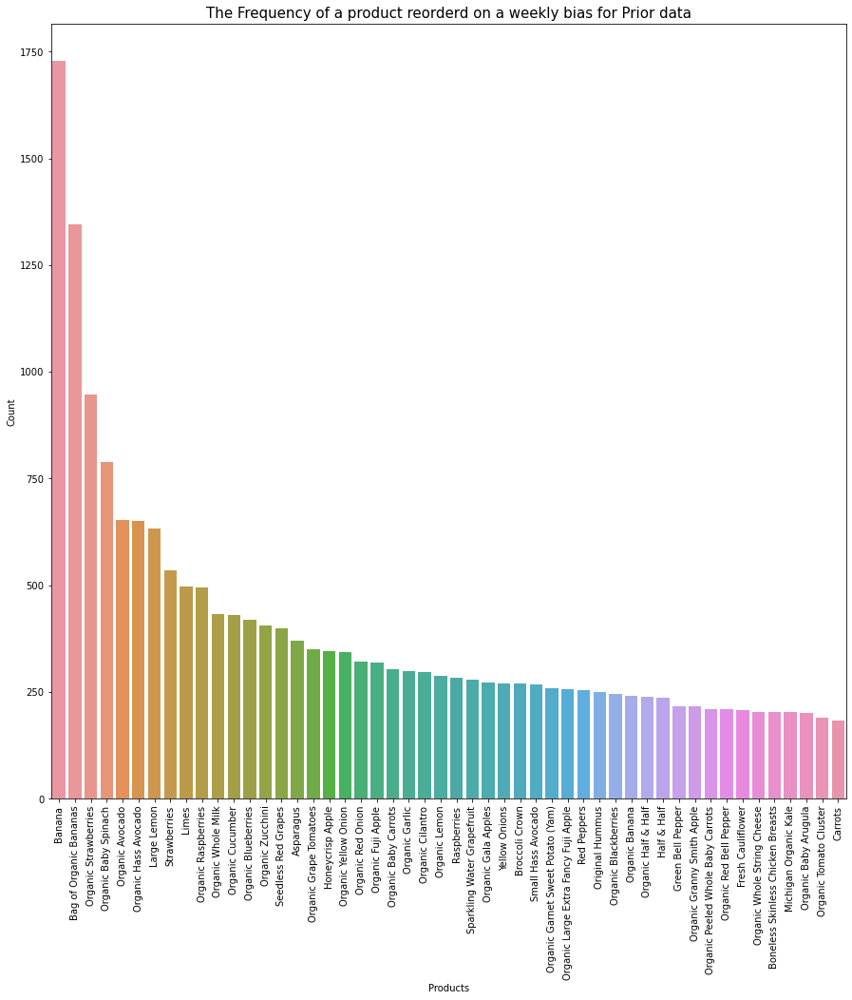

In [129]:
temp = train_analysis[train_analysis.reordered==1]
plt.figure(figsize=(15,15))
sn.barplot(train_analysis[train_analysis.days_since_prior_order==7]['product_name'].value_counts().index[:50],
          train_analysis[train_analysis.days_since_prior_order==7]['product_name'].value_counts().values[:50])
plt.xticks(rotation='vertical')
plt.title("The Frequency of top 50 product reorderd on a weekly bias for Prior data",fontsize=15)
plt.ylabel('Count',fontsize=10)
plt.xlabel("Products",fontsize=10)
plt.show()

### Monthly purchase analysis of a products

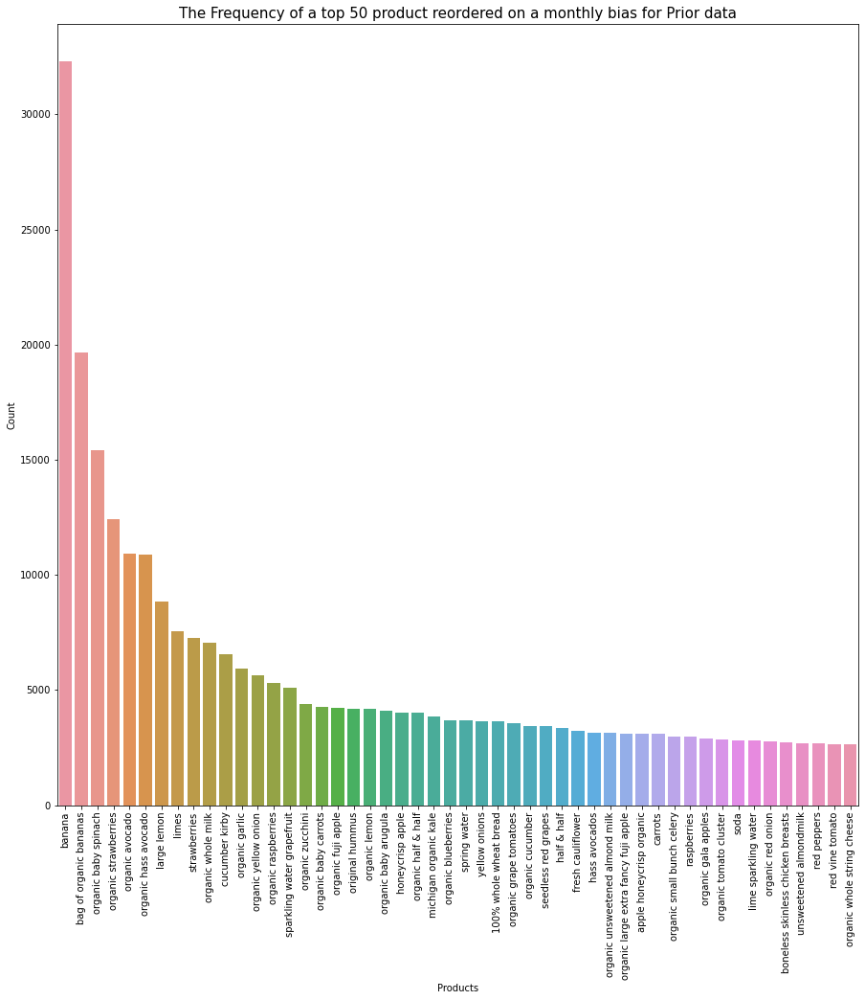

In [133]:
temp = prior_analysis[prior_analysis.reordered==1]
plt.figure(figsize=(15,15))

sn.barplot(temp[temp.days_since_prior_order==30]['product_name'].value_counts().index[:50],
          temp[temp.days_since_prior_order==30]['product_name'].value_counts().values[:50])
plt.xticks(rotation='vertical')
plt.title("The Frequency of a top 50 product reordered on a monthly bias for Prior data",fontsize=15)
plt.ylabel('Count',fontsize=10)
plt.xlabel("Products",fontsize=10)
plt.show()

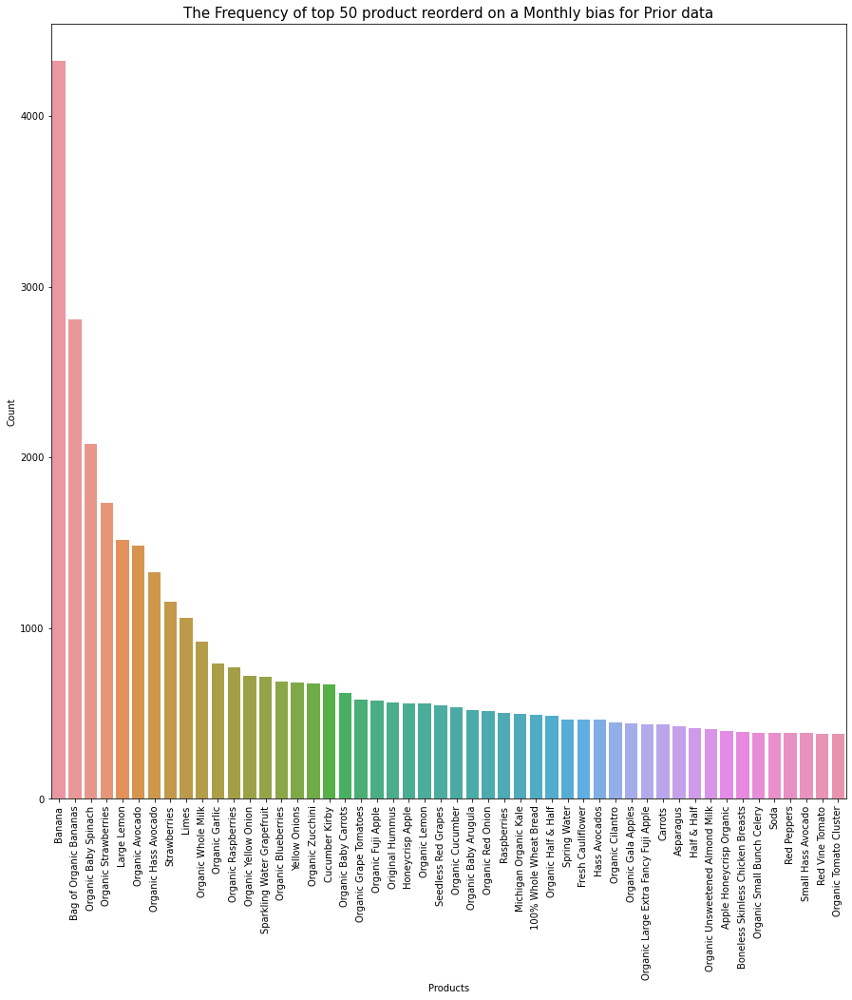

In [137]:
temp = train_analysis[train_analysis.reordered==1]
plt.figure(figsize=(15,15))
sn.barplot(temp[temp.days_since_prior_order==30]['product_name'].value_counts().index[:50],
          temp[temp.days_since_prior_order==30]['product_name'].value_counts().values[:50])
plt.xticks(rotation='vertical')
plt.title("The Frequency of top 50 product reorderd on a Monthly bias for Prior data",fontsize=15)
plt.ylabel('Count',fontsize=10)
plt.xlabel("Products",fontsize=10)
plt.show()

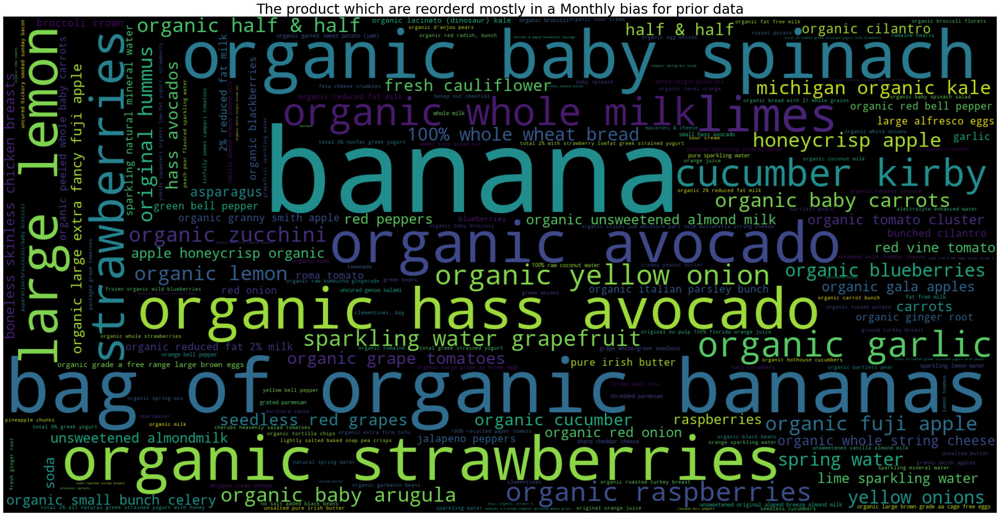

Time taken to run this cell : 0:00:04.441289


In [143]:
# Ploting word cloud
temp = prior_analysis[prior_analysis.reordered==1]
result=temp[temp.days_since_prior_order==30]['product_name'].value_counts().to_dict()
start = datetime.now()

# Lets first convert the 'result' dictionary to 'list of tuples'
tup = dict(result.items())
#Initializing WordCloud using frequencies of tags.
wordcloud = WordCloud(    background_color='black',
                          width=1600,
                          height=800,
                    ).generate_from_frequencies(tup)
fig = plt.figure(figsize=(30,20))
plt.title("The product which are reorderd mostly in a Monthly bias for prior data",fontsize=30)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
print("Time taken to run this cell :", datetime.now() - start)

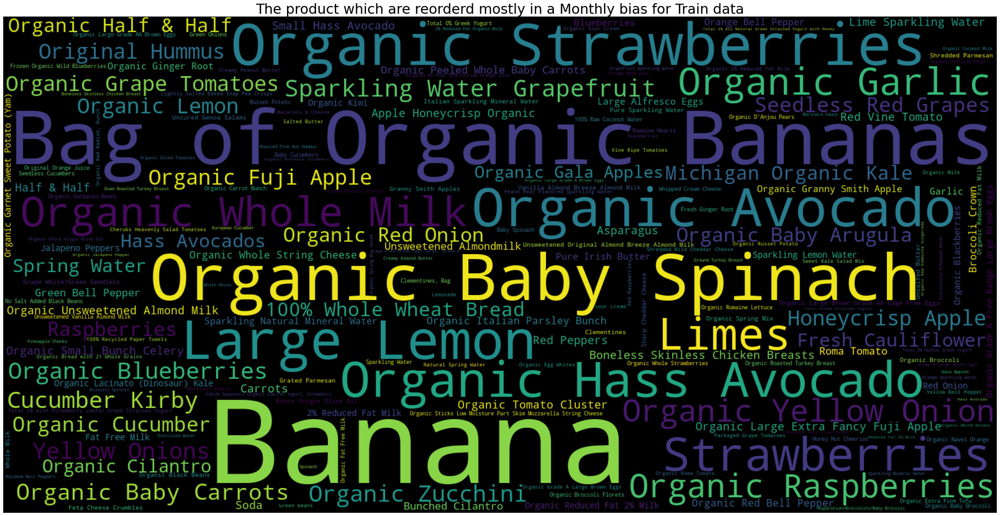

Time taken to run this cell : 0:00:04.691778


In [141]:
# Ploting word cloud
temp = train_analysis[train_analysis.reordered==1]
result=temp[temp.days_since_prior_order==30]['product_name'].value_counts().to_dict()
start = datetime.now()

# Lets first convert the 'result' dictionary to 'list of tuples'
tup = dict(result.items())
#Initializing WordCloud using frequencies of tags.
wordcloud = WordCloud(    background_color='black',
                          width=1600,
                          height=800,
                    ).generate_from_frequencies(tup)
fig = plt.figure(figsize=(30,20))
plt.title("The product which are reorderd mostly in a Monthly bias for Train data",fontsize=30)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
print("Time taken to run this cell :", datetime.now() - start)

## Bivariate analysis

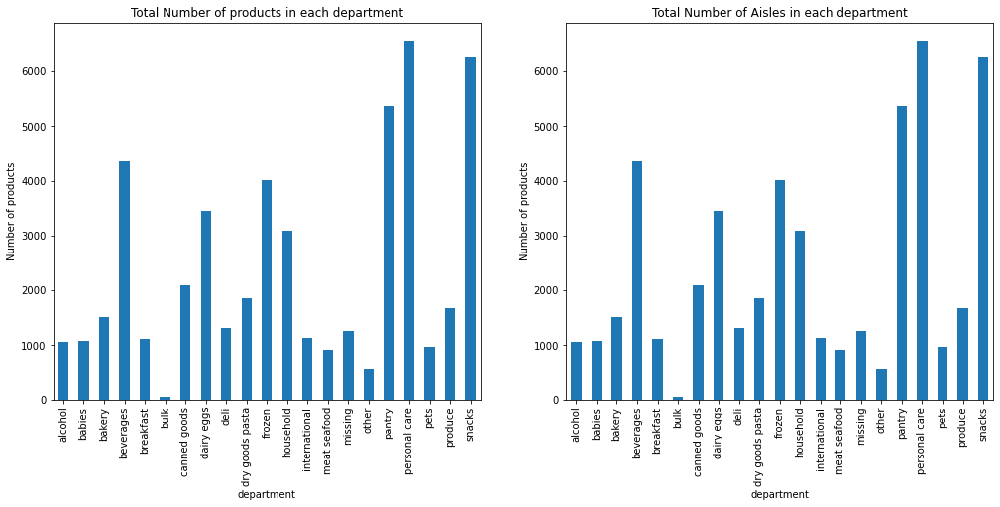

In [20]:
plt.figure(figsize=(17,7))
plt.subplot(1, 2, 1)
all_items.groupby('department').count()["product_id"].plot(kind='bar')
plt.title("Total Number of products in each department")
plt.ylabel("Number of products")

plt.subplot(1, 2, 2)
all_items.groupby('department').count()["aisle_id"].plot(kind='bar')
plt.title("Total Number of Aisles in each department")
plt.ylabel("Number of products")
plt.show()

<h> From the above plot we can see that each department has how many no of products and aisle top 3 departments are
<pre>      1.Personal_care
      2.snacks
      3.pantry
<h>

In [21]:
left  = 0.125  # the left side of the subplots of the figure
right = 0.9    # the right side of the subplots of the figure
bottom = 0.5   # the bottom of the subplots of the figure
top = 0.9      # the top of the subplots of the figure
wspace = 0.2   # the amount of width reserved for blank space between subplots
hspace = 3    # the amount of height reserved for white space between subplots
plt.subplots_adjust(left, bottom, right, top, wspace, hspace)


<Figure size 432x288 with 0 Axes>

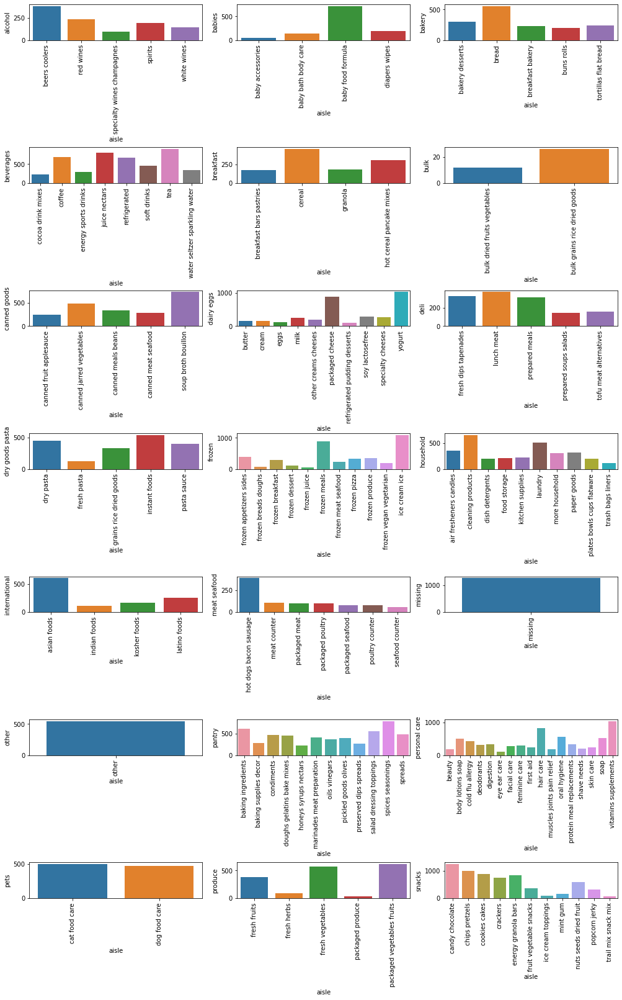

In [22]:
plt.figure(figsize=(17,50))
for i ,e in enumerate(departments.department.sort_values(ascending=True)):
    plt.subplot(7,3,i+1)
    plt.subplots_adjust(left, bottom, right, top, wspace, hspace)
    sn.barplot(all_items[all_items['department']==e].groupby('aisle').count()['product_id'].index,all_items[all_items['department']==e].groupby('aisle').count()['product_id'].values)
    #all_items[all_items['department']==e].groupby('aisle').count()['product_id'].plot(kind='bar')
    plt.xticks(rotation='vertical')
    plt.ylabel(e)
plt.show()

In [39]:
prior_analysis[['aisle','product_name']].groupby('aisle').count()['product_name']

aisle
air fresheners candles             19851
asian foods                       166607
baby accessories                    8160
baby bath body care                 8581
baby food formula                 382456
                                  ...   
trash bags liners                  32081
vitamins supplements               45059
water seltzer sparkling water     841533
white wines                        30558
yogurt                           1452343
Name: product_name, Length: 134, dtype: int64

<h>
    </pre> From the above plot we can see that for each department how many aisles_dep product are sold <pre>

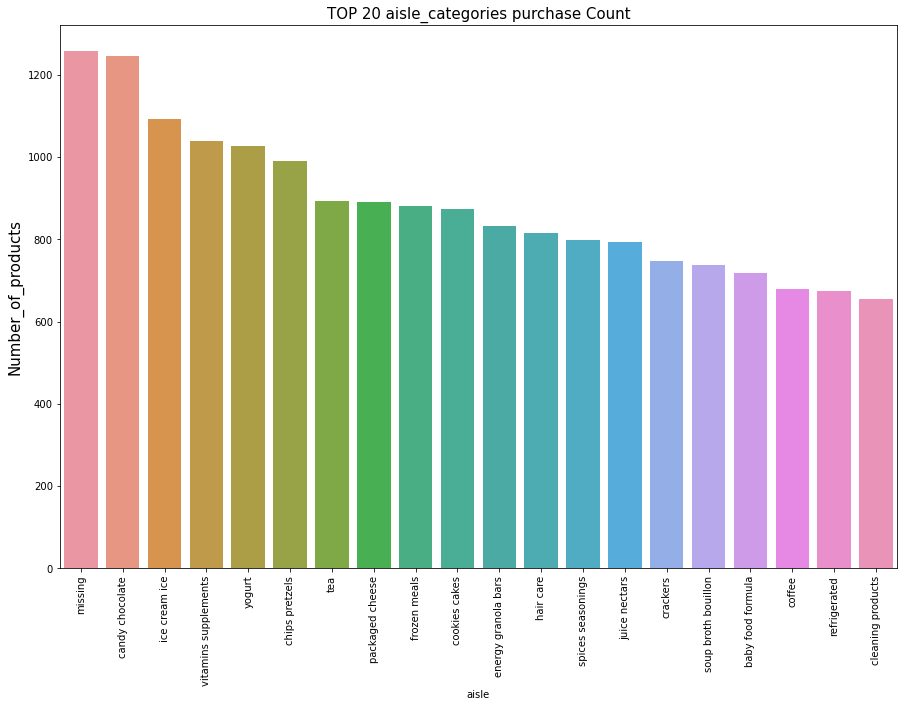

In [23]:
plt.figure(figsize=(15,10))
sn.barplot(all_items.groupby('aisle').count()['product_name'].sort_values(ascending=False).head(20).index,
          all_items.groupby('aisle').count()['product_name'].sort_values(ascending=False).head(20).values)
plt.ylabel("Number_of_products",fontsize=15)
plt.title("TOP 20 aisle_categories purchase Count",fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

In [37]:
print("The Mean or median of shoping of a user since his last order is \nMean: {}\nMedian: {}"
                          .format(orders.groupby('user_id').mean()['days_since_prior_order'].mean(),
                                 orders.groupby('user_id').mean()['days_since_prior_order'].median()))

The Mean or median of shoping of a user since his last order is 
Mean: 15.448686320165203
Median: 15.0


<p> As we can see that average of all user shop with 15 days since prior order<p>

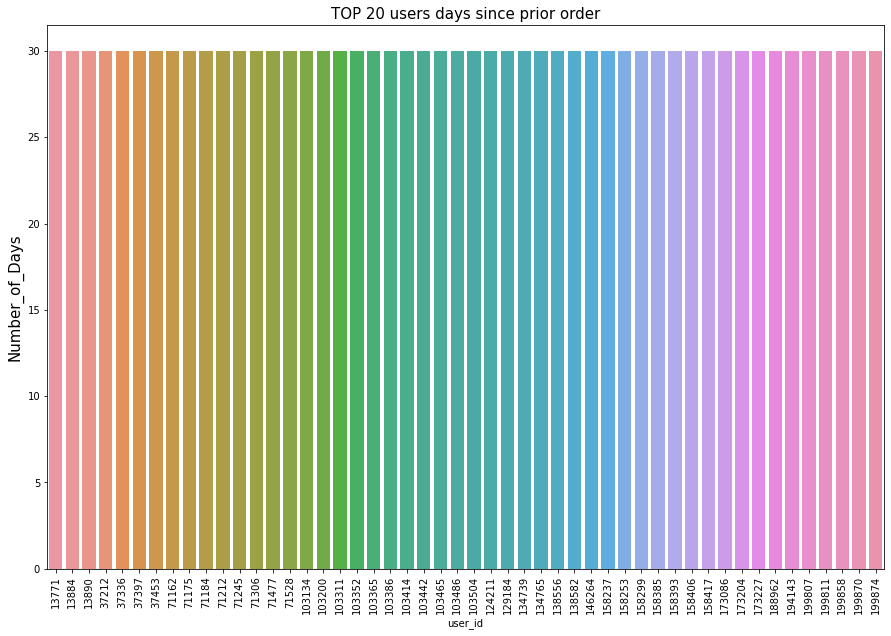

In [50]:
plt.figure(figsize=(15,10))
sn.barplot(orders.groupby('user_id').mean()['days_since_prior_order'].sort_values(ascending=False).head(50).index,
           orders.groupby('user_id').mean()['days_since_prior_order'].sort_values(ascending=False).head(50).values)
plt.ylabel("Number_of_Days",fontsize=15)
plt.title("TOP 20 users days since prior order",fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

<p> As we can that top 50 users days since prior is 30 days <p>

### Bivariate analysis with target variable

In [49]:
heat = train_analysis.groupby(['order_dow','order_hour_of_day'])['reordered'].aggregate('count').reset_index()
heat = heat.pivot(index='order_dow',columns='order_hour_of_day',values='reordered')

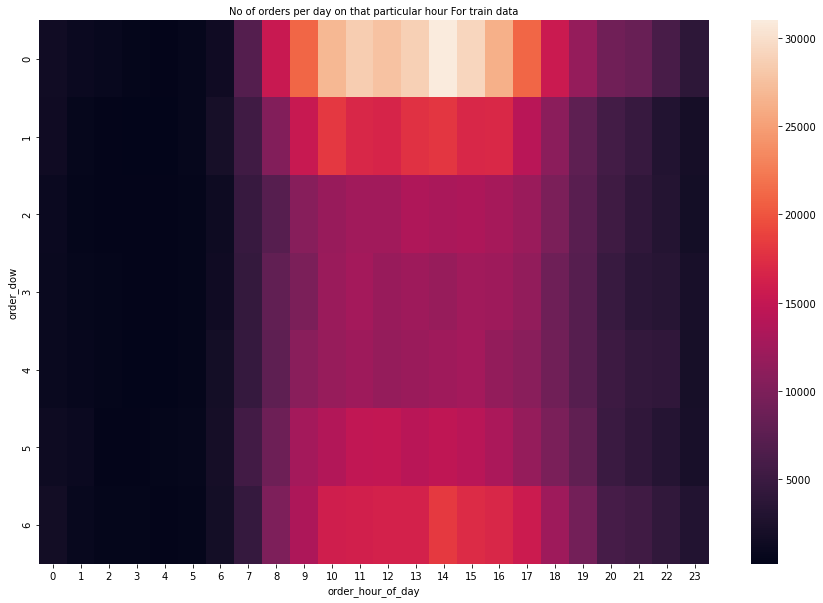

In [50]:
plt.figure(figsize=(15,10))
sn.heatmap(heat)
plt.title("No of orders per day on that particular hour For train data",fontsize=10)
plt.show()

In [51]:
heat = prior_analysis.groupby(['order_dow','order_hour_of_day'])['reordered'].aggregate('count').reset_index()
heat = heat.pivot(index='order_dow',columns='order_hour_of_day',values='reordered')

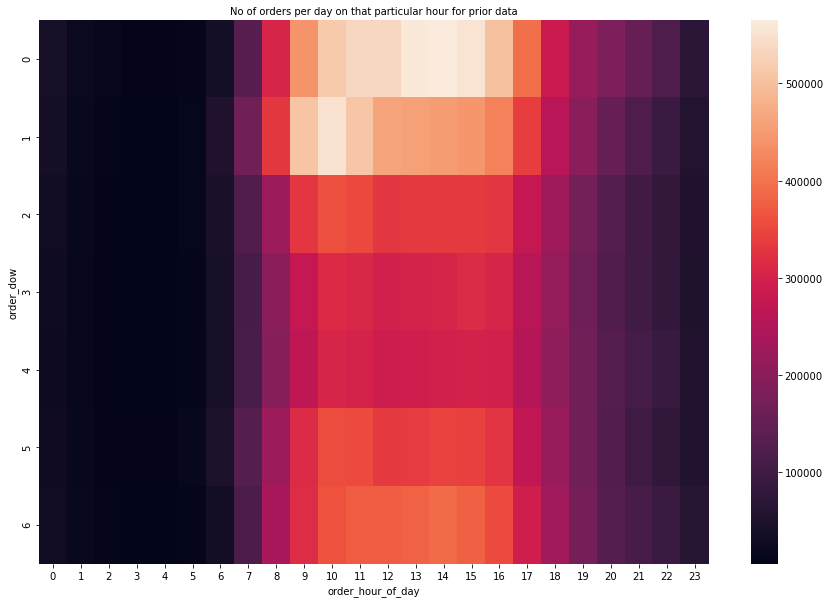

In [52]:
plt.figure(figsize=(15,10))
sn.heatmap(heat)
plt.title("No of orders per day on that particular hour for prior data",fontsize=10)
plt.show()

### The both heatmap show very similar results that on day 0 and 1(saturday and suday) in between 9 to 14 hours the users place a lot of orders

In [145]:
heat = prior_analysis.groupby(['add_to_cart_order','order_hour_of_day'])['reordered'].aggregate('count').reset_index()
heat = heat.pivot(index='add_to_cart_order',columns='order_hour_of_day',values='reordered')

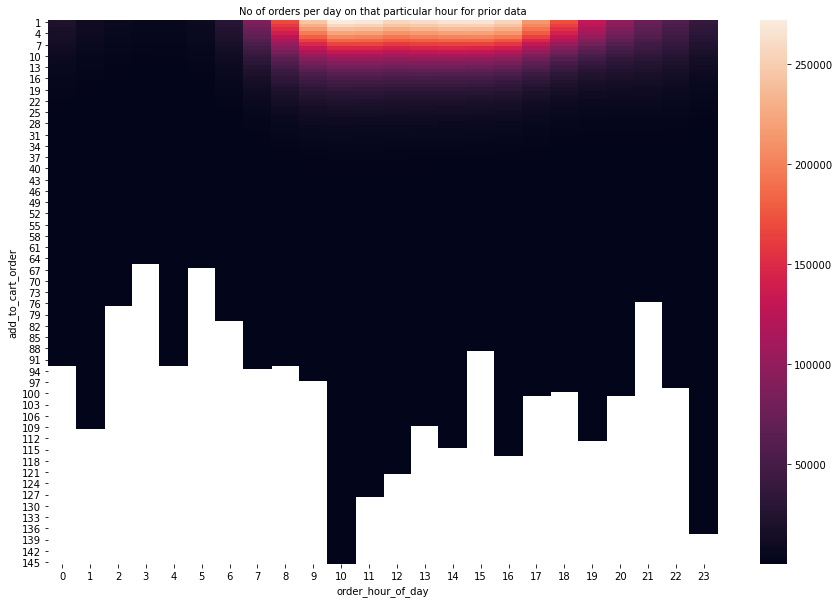

In [146]:
plt.figure(figsize=(15,10))
sn.heatmap(heat)
plt.title("No of orders per day on that particular hour for prior data",fontsize=10)
plt.show()

In [147]:
heat = prior_analysis.groupby(['add_to_cart_order','order_dow'])['reordered'].aggregate('count').reset_index()
heat = heat.pivot(index='add_to_cart_order',columns='order_dow',values='reordered')

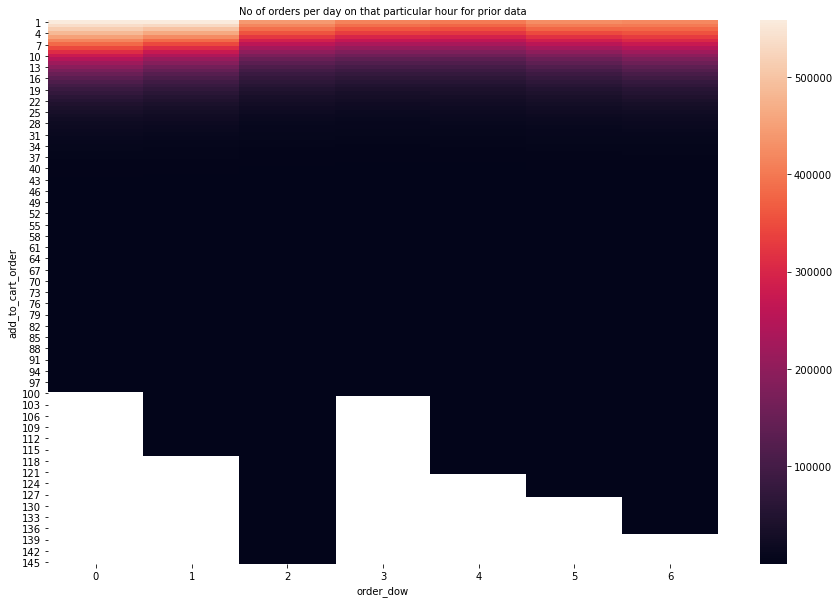

In [148]:
plt.figure(figsize=(15,10))
sn.heatmap(heat)
plt.title("No of orders per day on that particular hour for prior data",fontsize=10)
plt.show()